In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import plotly.offline as pyo
import plotly.graph_objs as go
import plotly.graph_objects as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()
import plotly.express as px
from plotly.subplots import make_subplots

import re

from wordcloud import WordCloud, STOPWORDS

In [2]:
FILE = 'input_data.xlsx'

X0 = 'Final Data'
X1 = 'Short description'
X2 = 'Description'
X3 = 'Caller'
Y = 'Assignment group'

X4 = 'Word Count'

In [3]:
data = pd.read_excel(FILE, engine='openpyxl')
data.head()

,Short description,Description,Caller,Assignment group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,_x000D_\n_x000D_\nreceived from: hmjdrvpb.komu...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,_x000D_\n_x000D_\nreceived from: eylqgodm.ybqk...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8492 non-null   object
 1   Description        8499 non-null   object
 2   Caller             8500 non-null   object
 3   Assignment group   8500 non-null   object
dtypes: object(4)
memory usage: 265.8+ KB


## Working with duplication of data, row wise as well as column wise

### Row wise duplication
Find all duplicate checking with X1, X2 and Y have same.

In [5]:
duplicate = data[data.duplicated([X1, X2, Y])]

In [6]:
data.drop(duplicate.index, inplace=True)

There are still data where X1 and X2 are same but target variable Y is different. Need to see what needs to be done for that. There are 16 such rows which has X1 and X2 same but Y different

In [7]:
confused = data[data.duplicated([X1, X2])]

In [8]:
def get_potential_wrong_labelled_data(short_desc):
    if str(confused[X1]).find(str(short_desc)) != -1:
        return True
    return False

potential_wrong_data = data[data.apply(lambda x: get_potential_wrong_labelled_data(x[X1]), axis=1)]

In [9]:
potential_wrong_data.sort_values([X1, X2])

,Short description,Description,Caller,Assignment group
7552,account locked,_x000D_\n_x000D_\nreceived from: vhlepcta.lqbg...,vhlepcta lqbgcxpt,GRP_0
1526,account locked,account locked,vgzmjkop rgeubdco,GRP_0
3524,account locked,"ic\n welcome, our next available agent will be...",bnoupaki cpeioxdz,GRP_0
423,account locked.,account locked.,bkyphsgq cfyksehu,GRP_0
3075,account locked.,account locked.,sygionua szunhced,GRP_34
7828,account locked.,account locked.,ydigzqbu xdgjizek,GRP_72
7824,account locked.,account locked_x000D_\n,tfnzwycd bicohjga,GRP_0
1300,cannot review stock at mdw04 // mm 6720004,_x000D_\n_x000D_\nreceived from: aqrhwjgo.cyel...,aqrhwjgo cyelqkvs,GRP_6
1301,cannot review stock at mdw04 // mm 6720004,_x000D_\n_x000D_\nreceived from: aqrhwjgo.cyel...,aqrhwjgo cyelqkvs,GRP_0
2513,ethics,\n\nreceived from: soujqrxw.mvwduljx@gmail.com...,soujqrxw mvwduljx,GRP_0


In [10]:
potential_wrong_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 34 entries, 1 to 8353
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  34 non-null     object
 1   Description        34 non-null     object
 2   Caller             34 non-null     object
 3   Assignment group   34 non-null     object
dtypes: object(4)
memory usage: 1.3+ KB


### Column wise duplication

This is required to check and as ultimately we are going to merge both of the columns in the end before feeding to model for training. This will help in removing unecessary redundancy of data which impacts the outcome. There are 3592 such rows

In [11]:
redundant_desc = data[data.apply(lambda x: str(x[X2]).find(str(x[X1])) != -1, axis=1)]
redundant_desc

,Short description,Description,Caller,Assignment group
1,outlook,_x000D_\n_x000D_\nreceived from: hmjdrvpb.komu...,hmjdrvpb komuaywn,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0
5,unable to log in to engineering tool and skype,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,GRP_0
7,ticket_no1550391- employment status - new non-...,ticket_no1550391- employment status - new non-...,eqzibjhw ymebpoih,GRP_0
...,...,...,...,...
8492,hr_tool etime option not visitble,hr_tool etime option not visitble,tmopbken ibzougsd,GRP_0
8494,tablet needs reimaged due to multiple issues w...,tablet needs reimaged due to multiple issues w...,cpmaidhj elbaqmtp,GRP_3
8496,telephony_software issue,telephony_software issue,rbozivdq gmlhrtvp,GRP_0
8497,vip2: windows password reset for tifpdchb pedx...,vip2: windows password reset for tifpdchb pedx...,oybwdsgx oxyhwrfz,GRP_0


In [12]:
def merge_data(short_desc, long_desc):
    if str(long_desc).find(str(short_desc)) != -1:
        return str(long_desc).lower()
    else:
        return (str(short_desc) + " " + str(long_desc)).lower()


data[X0] = data.apply(lambda x: merge_data(x[X1], x[X2]), axis=1)
data.head()

,Short description,Description,Caller,Assignment group,Final Data
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,login issue -verified user details.(employee# ...
1,outlook,_x000D_\n_x000D_\nreceived from: hmjdrvpb.komu...,hmjdrvpb komuaywn,GRP_0,_x000d_\n_x000d_\nreceived from: hmjdrvpb.komu...
2,cant log in to vpn,_x000D_\n_x000D_\nreceived from: eylqgodm.ybqk...,eylqgodm ybqkwiam,GRP_0,cant log in to vpn _x000d_\n_x000d_\nreceived ...
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr_tool page
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error


In [13]:
data.isna().sum()

Short description    5
Description          1
Caller               0
Assignment group     0
Final Data           0
dtype: int64

Since we don't have any null in final data, it is not required to eliminate any rows completely.

In [14]:
data.reset_index(inplace=True)

## Add count of words

This is required to analyse what should be the length our model should take to understand it's group

In [15]:
data[X4] = data[X0].str.split(" ").apply(lambda x: len(x))

In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7909 entries, 0 to 7908
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   index              7909 non-null   int64 
 1   Short description  7904 non-null   object
 2   Description        7908 non-null   object
 3   Caller             7909 non-null   object
 4   Assignment group   7909 non-null   object
 5   Final Data         7909 non-null   object
 6   Word Count         7909 non-null   int64 
dtypes: int64(2), object(5)
memory usage: 432.6+ KB


## Target column analysis

Need to find how many classifications are there in the data since we are going to classify into this classes.

* Requires to check biasness in data provided, this will help in finding the approach on how to move forward

In [17]:
data[Y].unique()

array(['GRP_0', 'GRP_1', 'GRP_3', 'GRP_4', 'GRP_5', 'GRP_6', 'GRP_7',
       'GRP_8', 'GRP_9', 'GRP_10', 'GRP_11', 'GRP_12', 'GRP_13', 'GRP_14',
       'GRP_15', 'GRP_16', 'GRP_17', 'GRP_18', 'GRP_19', 'GRP_2',
       'GRP_20', 'GRP_21', 'GRP_22', 'GRP_23', 'GRP_24', 'GRP_25',
       'GRP_26', 'GRP_27', 'GRP_28', 'GRP_29', 'GRP_30', 'GRP_31',
       'GRP_33', 'GRP_34', 'GRP_35', 'GRP_36', 'GRP_37', 'GRP_38',
       'GRP_39', 'GRP_40', 'GRP_41', 'GRP_42', 'GRP_43', 'GRP_44',
       'GRP_45', 'GRP_46', 'GRP_47', 'GRP_48', 'GRP_49', 'GRP_50',
       'GRP_51', 'GRP_52', 'GRP_53', 'GRP_54', 'GRP_55', 'GRP_56',
       'GRP_57', 'GRP_58', 'GRP_59', 'GRP_60', 'GRP_61', 'GRP_32',
       'GRP_62', 'GRP_63', 'GRP_64', 'GRP_65', 'GRP_66', 'GRP_67',
       'GRP_68', 'GRP_69', 'GRP_70', 'GRP_71', 'GRP_72', 'GRP_73'],
      dtype=object)

In [18]:
agg_data = data.groupby(Y).size().reset_index(name = 'count')
fig = px.pie(agg_data, values='count', names=Y, title='Ticket Assignment')
fig.show()

In [19]:
fig = px.pie(agg_data[agg_data[Y]!='GRP_0'], values='count', names=Y, title='Ticket Assignment non GRP_0')
fig.show()

We have in total 74 groups in 7909 rows of data, and out of that 43% of data is just assigned to *GRP_0* which is clearly biased towards it. Few of the groups are so negligible that don't even have more than 10 of such rows. It would be better to split data into data with only *GRP_0* and *non-GRP_0* to make analysis much more precise

In [20]:
# def  clean_text(df, text_field, new_text_field_name):
#     df[new_text_field_name] = df[text_field].str.lower()
#     df[new_text_field_name] = df[new_text_field_name].apply(lambda elem: re.sub(r"(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)|^rt|http.+?", "", elem))  
#     # remove numbers
#     df[new_text_field_name] = df[new_text_field_name].apply(lambda elem: re.sub(r"\d+", "", elem))
#     return df

In [21]:
data_non_0 = data[data[Y] != 'GRP_0']
data_0 = data[data[Y] == 'GRP_0']

In [22]:
fig = make_subplots(rows=3, cols=1)
fig.add_trace(go.Box(x=data[X4], quartilemethod='exclusive', name='Desc All'), row=1, col=1)
fig.add_trace(go.Box(x=data_0[X4], quartilemethod='exclusive', name='Desc GRP0'), row=2, col=1)
fig.add_trace(go.Box(x=data_non_0[X4], quartilemethod='exclusive', name='Desc Non GRP0'), row=3, col=1)

fig.update_traces(showlegend=False)
fig.update_layout({
    'width':1024,
    'height':600,
    'title':'Description total words'
})
fig.show()

In [23]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
index,7909.0,4220.257555,2464.185439,0.0,2081.0,4204.0,6358.0,8499.0
Word Count,7909.0,34.939436,73.116389,1.0,8.0,20.0,33.0,1431.0


In [24]:
data_0.describe().T

,count,mean,std,min,25%,50%,75%,max
index,3429.0,4127.175270,2495.988356,0.0,1975.0,4108.0,6297.0,8497.0
Word Count,3429.0,21.928551,31.698880,1.0,6.0,12.0,28.0,478.0


In [25]:
data_non_0.describe().T

,count,mean,std,min,25%,50%,75%,max
index,4480.0,4291.502902,2437.441908,6.0,2178.75,4279.5,6404.25,8499.0
Word Count,4480.0,44.897991,91.874542,1.0,12.00,20.0,40.00,1431.0


From above **boxplot** *&* **description** it is clear that data from the group **GRP_0** has word count much less than any other group. This will be improved or some data loss will be there when gibberish data is cleansed from the given data

In [26]:
data[data[X4] <= 5]

,index,Short description,Description,Caller,Assignment group,Final Data,Word Count
3,3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr_tool page,5
4,4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error,3
9,9,ticket update on inplant_874773,ticket update on inplant_874773,fumkcsji sarmtlhy,GRP_0,ticket update on inplant_874773,4
14,14,unable to open payslips,unable to open payslips,epwyvjsz najukwho,GRP_0,unable to open payslips,5
15,15,ticket update on inplant_874743,ticket update on inplant_874743,fumkcsji sarmtlhy,GRP_0,ticket update on inplant_874743,4
...,...,...,...,...,...,...,...
7884,8474,inquiry about employee- shesyhur posrt,inquiry about employee- shesyhur posrt,pvlxjizg xzvlwqjc,GRP_0,inquiry about employee- shesyhur posrt,5
7885,8475,etime- time card update information.,etime- time card update information.,tmopbken ibzougsd,GRP_0,etime- time card update information.,5
7892,8482,robot HostName_776 is inactive,robot HostName_776 is inactive,rkupnshb gsmzfojw,GRP_8,robot hostname_776 is inactive,4
7896,8486,ticket update on ticket_no0427635,ticket update on ticket_no0427635,fumkcsji sarmtlhy,GRP_0,ticket update on ticket_no0427635,4


In [27]:
cloud = WordCloud(random_state=1, collocations=False)

In [28]:
def plot_cloud(wordcloud_data):
    wordcloud = cloud.generate(wordcloud_data)
    # Set figure size
    plt.figure(figsize=(30, 20))
    # Display image
    plt.imshow(wordcloud, interpolation='bilinear') 
    # No axis details
    plt.axis("off")
    plt.show()

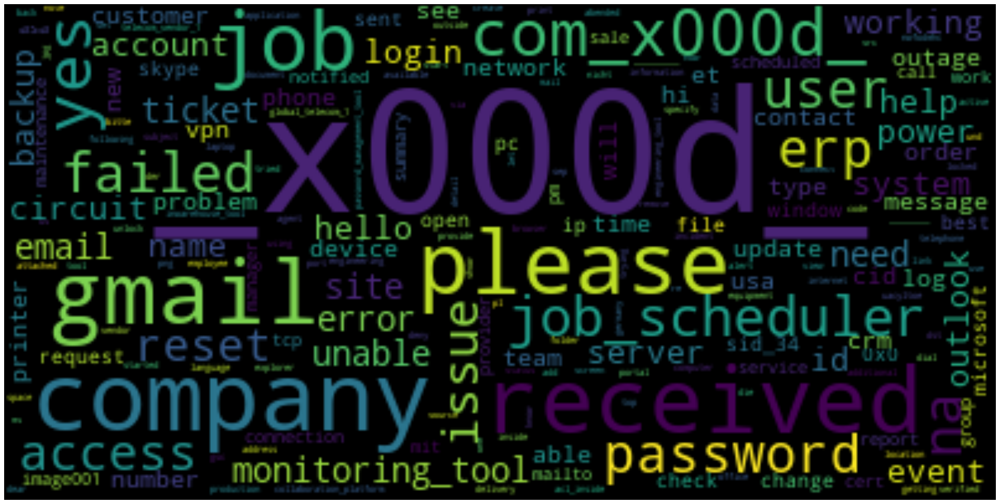

In [29]:
plot_cloud(' '.join(data[X0]))

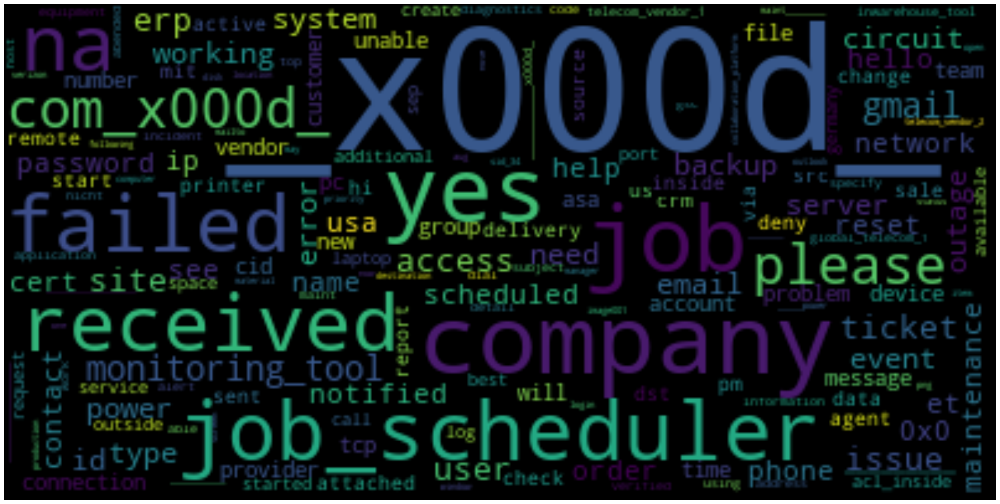

In [30]:
plot_cloud(' '.join(data_non_0[X0]))

All these word clouds are useful to detect some pattern of data having words like ***\_x000d\_*** needs to be removed. Word clouds can be used again and again to detect such data to clean data.

### Types of words used in particular group

Apart from finding the count of words per group, it is crucial to check what kind of words are used most in particular group. Some of the words can be specific to the group and can help to identify their group based on such keywords used

In [31]:
import nltk
from nltk.corpus import stopwords
from sklearn.feature_extraction.stop_words import ENGLISH_STOP_WORDS
from spacy.lang.en import English
import string
from collections import Counter
import spacy
import en_core_web_sm

C:\Users\jimit\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning:

The sklearn.feature_extraction.stop_words module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_extraction.text. Anything that cannot be imported from sklearn.feature_extraction.text is now part of the private API.



In [32]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\jimit\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [33]:
parser = English()
nlp = en_core_web_sm.load()
punctuations = string.punctuation

STOPLIST = stopwords.words('english') + list(ENGLISH_STOP_WORDS)
SYMBOLS = ' '.join(punctuations).split(" ") + ["-", "…", """, """]

In [120]:
# Function to cleanup the text in increments. This is just required till clean data is not passed
def cleanup_text(docs, logging=False):
    texts = []
    counter = 1
    for doc in docs:
        if counter % 1000 == 0 and logging:
            print("Processed %d out of %d documents." % (counter, len(docs)))
        counter += 1
        doc = nlp(doc, disable=['parser', 'ner'])
        tokens = [tok.lemma_.lower().strip() for tok in doc if tok.lemma_ != '-PRON-']
        tokens = [tok for tok in tokens if tok not in STOPLIST and tok not in SYMBOLS]
        tokens = ' '.join(tokens)
        texts.append(tokens)
      
    return pd.Series(texts)

# Function to find common words for each defined category
def find_common_words_by_category(categories, N):
    common_words = {}
    for category in categories:
        category_text = [text for text in data[data[Y] == category][X0]]
        
        # Below cleanup won't be required once we get clean data
        cleanup_category_text = cleanup_text(category_text)
        cleanup_category_text = ' '.join(cleanup_category_text).split()
        category_counter = Counter(cleanup_category_text)
        cat_dict = {}
        for word in category_counter.most_common(N):
            cat_dict[word[0]] = word[1]
        common_words[category] = cat_dict
        
        word_statement = f"{category} has {common_words[category]}"
    return common_words

In [121]:
top_words = find_common_words_by_category(data[Y].unique(), 100)

In [118]:
def plot_cloud_freq(wordcloud_data):
    total_categories = len(wordcloud_data)
    fig = plt.figure(figsize=(20, 200))
    
    i = 0
    for category in wordcloud_data:
        wordcloud = cloud.generate_from_frequencies(wordcloud_data[category])
        ax= plt.subplot(int(total_categories / 2), 2, i + 1)
        im=ax.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(category, fontsize=16)
        i = i + 1
    plt.show()

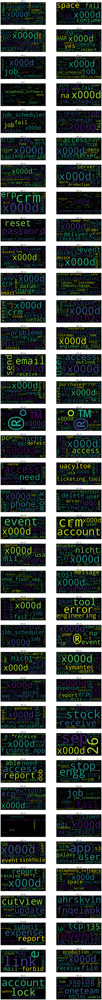

In [119]:
plot_cloud_freq(top_words)